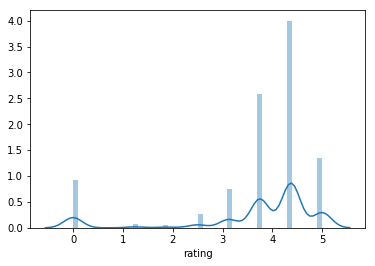

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn import preprocessing
import numpy as np

nutrients = ['calories', 'protein', 'fat', 'sodium']
categories_meals = ['appetizer',
'breakfast',
'brunch',
'buffet',
'dessert',
'dinner',
'lunch',
'side']


recipes = pd.read_csv('epi_r_Epicurious.csv')
columns = nutrients + categories_meals
columns.append('rating')
recipes_categories_clustering = recipes[columns]
recipes = recipes.iloc[:,0:6]

recipes_notNan = recipes.dropna()

sns.distplot(recipes["rating"])
plt.savefig('rating_distribution.png')
plt.show()


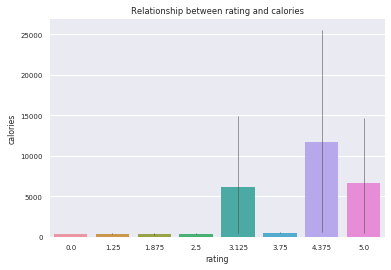

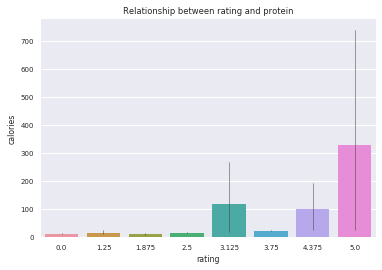

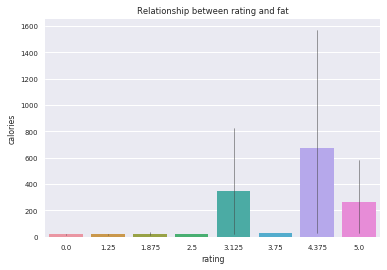

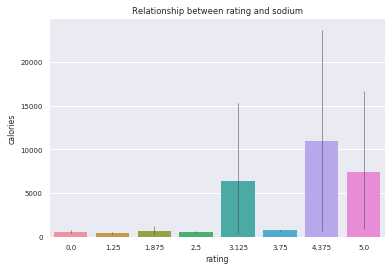

In [41]:
ax=sns.barplot(x="rating",y="calories", data=recipes_notNan, errwidth=0.5)
ax.set(ylabel='calories')
plt.title("Relationship between rating and calories")

plt.show()

ax=sns.barplot(x="rating",y="protein", data=recipes_notNan, errwidth=0.5)
ax.set(ylabel='calories')
plt.title("Relationship between rating and protein")

plt.show()

ax=sns.barplot(x="rating",y="fat", data=recipes_notNan, errwidth=0.5)
ax.set(ylabel='calories')
plt.title("Relationship between rating and fat")

plt.show()

ax=sns.barplot(x="rating",y="sodium", data=recipes_notNan, errwidth=0.5)
ax.set(ylabel='calories')
plt.title("Relationship between rating and sodium")

plt.show()
plt.savefig('realtionship_rating_calories.png')


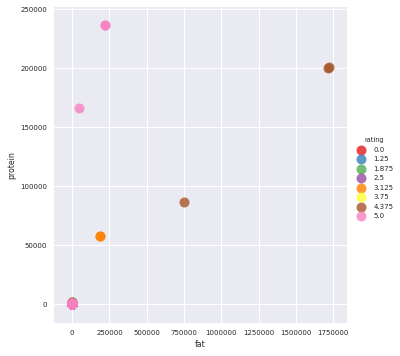

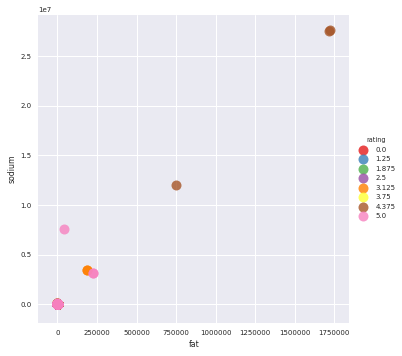

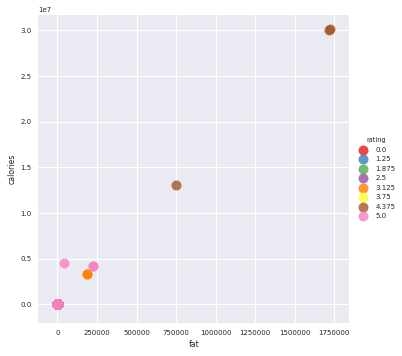

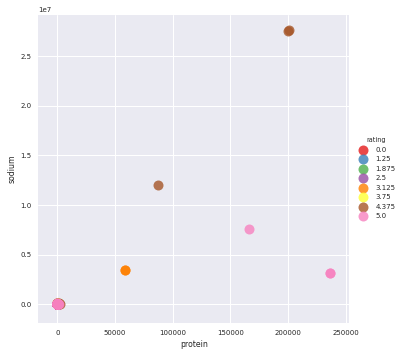

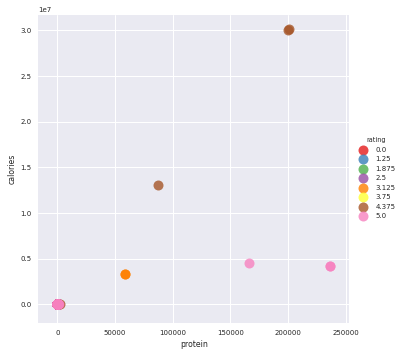

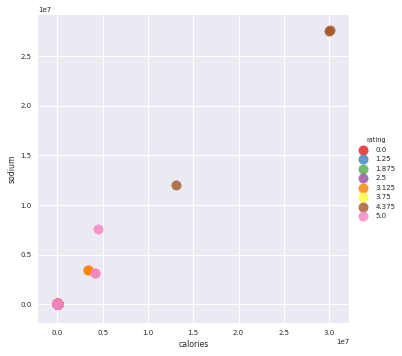

In [62]:
nutrient_v_nutrient = [['fat', 'protein'],
                       ['fat', 'sodium'],
                       ['fat', 'calories'],
                       ['protein', 'sodium'],
                       ['protein', 'calories'],
                       ['calories', 'sodium']]
counter_y = 0

for pairing in nutrient_v_nutrient:
    g = sns.lmplot(pairing[0], pairing[1], 
               data=recipes_notNan, 
               fit_reg=False, 
               palette="Set1",           
               hue="rating",
               scatter_kws={"marker": "D", 
                            "s": 100})
    g.set_axis_labels(pairing[0], pairing[1])

    counter_y += 1
    if counter_y > 2:
        counter_y = 0
        counter_x += 1

plt.show()
plt.savefig('nutrients_vs_nutrients.png')

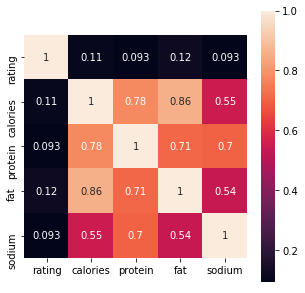

In [17]:
corr = recipes_notNan.iloc[:, 1:6].corr(method='spearman')
plt.figure(figsize=(5, 5))
sns.heatmap(corr, vmax=1, square=True,annot=True)
plt.show()
plt.savefig('nutrients_correlation_matrix.png')

In [39]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn import linear_model
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

recipes_clustering = recipes_notNan.iloc[:,1:6]
X = np.array(recipes_clustering.drop(['rating'], 1).astype(float))
# X = preprocessing.scale(X)
y = np.array(recipes_clustering['rating'])
lab_enc = preprocessing.LabelEncoder()
y_encoded = lab_enc.fit_transform(y)

X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)
#logistic = LogisticRegression()
#logistic.fit(X, y_encoded)
#y_pred = logistic.predict(X)
#print('Accuracy of logistic regression classifier: {:.2f}'.format(regr.score(X, y_encoded)))

clf = linear_model.LinearRegression()

clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

print("Mean squared error for nutrients and rating: %.2f"
      % mean_squared_error(y_test, y_pred))

recipes_calories_rating = X[:,0:1]

X_train1, X_test1, y_train1, y_test1 = train_test_split(recipes_calories_rating, y_encoded, test_size=0.2, random_state=42)

clf1 = linear_model.LinearRegression()

clf1.fit(X_train1, y_train1)

y_pred1 = clf1.predict(X_test1)

print("Mean squared error for calories and rating: %.2f"
      % mean_squared_error(y_test1, y_pred1))

print y_test1
print y_pred1

recipes_protein_rating = X[:,1:2]

X_train2, X_test2, y_train2, y_test2 = train_test_split(recipes_protein_rating, y_encoded, test_size=0.2, random_state=42)

clf2 = linear_model.LinearRegression()

clf2.fit(X_train2, y_train2)

y_pred2 = clf2.predict(X_test2)

print("Mean squared error for protein and rating: %.2f"
      % mean_squared_error(y_test2, y_pred2))

print y_test2
print y_pred2


recipes_fat_rating = X[:,2:3]

X_train3, X_test3, y_train3, y_test3 = train_test_split(recipes_fat_rating, y_encoded, test_size=0.2, random_state=42)

clf3 = linear_model.LinearRegression()

clf3.fit(X_train3, y_train3)

y_pred3 = clf3.predict(X_test3)

print("Mean squared error for fat and rating: %.2f"
      % mean_squared_error(y_test3, y_pred3))

recipes_sodium_rating = X[:,3:4]

X_train4, X_test4, y_train4, y_test4 = train_test_split(recipes_sodium_rating, y_encoded, test_size=0.2, random_state=42)

clf4 = linear_model.LinearRegression()

clf4.fit(X_train4, y_train4)

y_pred4 = clf4.predict(X_test4)

print("Mean squared error for sodium and rating: %.2f"
      % mean_squared_error(y_test4, y_pred4))


Mean squared error for nutrients and rating: 3.15
Mean squared error for calories and rating: 3.15
[2 5 6 ..., 5 5 5]
[ 5.09629479  5.09629824  5.0964079  ...,  5.09628336  5.0962966
  5.09630577]
Mean squared error for protein and rating: 3.15
[2 5 6 ..., 5 5 5]
[ 5.0958279   5.09585561  5.09627818 ...,  5.09578634  5.09589025
  5.09580019]
Mean squared error for fat and rating: 3.15
Mean squared error for sodium and rating: 3.15


In [33]:
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn import linear_model
from sklearn.metrics import mean_squared_error


recipes_categories_clustering = recipes_categories_clustering.dropna()

recipes_nutrients_categories = recipes_categories_clustering[(recipes_categories_clustering == 1).any(1)]

recipes_categories = recipes_nutrients_categories.iloc[:,4:12]

recipes_nutrients = np.array(recipes_nutrients_categories.iloc[:,0:4].astype(float))

recipes_categories_list = recipes_categories.T.to_dict('list')

recipes_categories_list_values =  [list(x) for x in set(tuple(x) for x in recipes_categories_list.values())]

enc = range(1,80)

encoded_values = []
for k1, v1 in enumerate(recipes_categories_list.values()):
    for k2, v2 in enumerate(recipes_categories_list_values):
        if v2 == v1:
            encoded_values.append(enc[k2])
            
            
X_train, X_test, y_train, y_test = train_test_split(recipes_categories_values, encoded_values, test_size=0.2, random_state=42)

clf = linear_model.LinearRegression()

clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)


print("Mean squared error for nutrients and categories: %.2f"
      % mean_squared_error(y_test, y_pred))


recipes_calories_categories = recipes_categories_values[:,0:1]

X_train1, X_test1, y_train1, y_test1 = train_test_split(recipes_calories_categories, encoded_values, test_size=0.2, random_state=42)

clf1 = linear_model.LinearRegression()

clf1.fit(X_train1, y_train1)

y_pred1 = clf1.predict(X_test1)

print("Mean squared error for calories and categories: %.2f"
      % mean_squared_error(y_test1, y_pred1))

recipes_protein_categories = recipes_categories_values[:,1:2]

X_train2, X_test2, y_train2, y_test2 = train_test_split(recipes_protein_categories, encoded_values, test_size=0.2, random_state=42)

clf2 = linear_model.LinearRegression()

clf2.fit(X_train2, y_train2)

y_pred2 = clf2.predict(X_test2)

print("Mean squared error for protein and categories: %.2f"
      % mean_squared_error(y_test2, y_pred2))

recipes_fat_categories = recipes_categories_values[:,2:3]

X_train3, X_test3, y_train3, y_test3 = train_test_split(recipes_fat_categories, encoded_values, test_size=0.2, random_state=42)

clf3 = linear_model.LinearRegression()

clf3.fit(X_train3, y_train3)

y_pred3 = clf3.predict(X_test3)

print("Mean squared error for fat and categories: %.2f"
      % mean_squared_error(y_test3, y_pred3))

recipes_sodium_categories = recipes_categories_values[:,3:4]

X_train4, X_test4, y_train4, y_test4 = train_test_split(recipes_sodium_categories, encoded_values, test_size=0.2, random_state=42)

clf4 = linear_model.LinearRegression()

clf4.fit(X_train4, y_train4)

y_pred4 = clf4.predict(X_test4)

print("Mean squared error for sodium and categories: %.2f"
      % mean_squared_error(y_test4, y_pred4))

Mean squared error for nutrients and categories: 810.60
Mean squared error for calories and categories: 811.88
Mean squared error for protein and categories: 811.85
Mean squared error for fat and categories: 811.88
Mean squared error for sodium and categories: 811.89


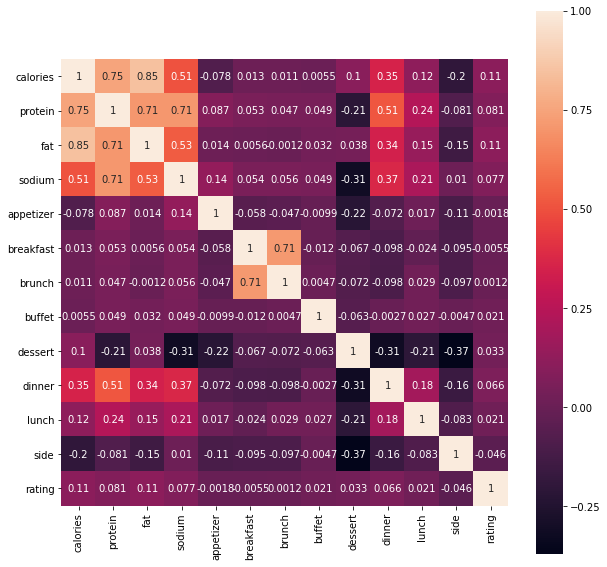

In [21]:
recipes_categories_correlation = temp.iloc[:,0:13]

corr = recipes_categories_correlation.iloc[:, 0:13].corr(method='spearman')
plt.figure(figsize=(10, 10))
sns.heatmap(corr, vmax=1, square=True,annot=True)
plt.show()
plt.savefig('categories_nutrients_correlation_matrix.png')

In [4]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn import preprocessing
import pandas as pd


recipes_clustering = recipes_notNan.iloc[:,1:6]
X = np.array(recipes_clustering.drop(['rating'], 1).astype(float))
X = preprocessing.scale(X)
y = np.array(recipes_clustering['rating'])
lab_enc = preprocessing.LabelEncoder()
y_encoded = lab_enc.fit_transform(y)

clf = KMeans(n_clusters=8)
clf.fit(X)

prediction = clf.predict(X)

print [n for n in prediction]

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [20]:
from sklearn.metrics.pairwise import pairwise_distances

values_ingredients_recipes = pd.read_csv('binary_matrix_ingredients.csv')

X = np.array(values_ingredients_recipes)

similarity_matrix = pairwise_distances(X, metric='jaccard')

scl = SpectralClustering(n_clusters=8, affinity='precomputed')
scl.fit(similarity_matrix)

print [x for x in scl.labels_]

KeyboardInterrupt: 

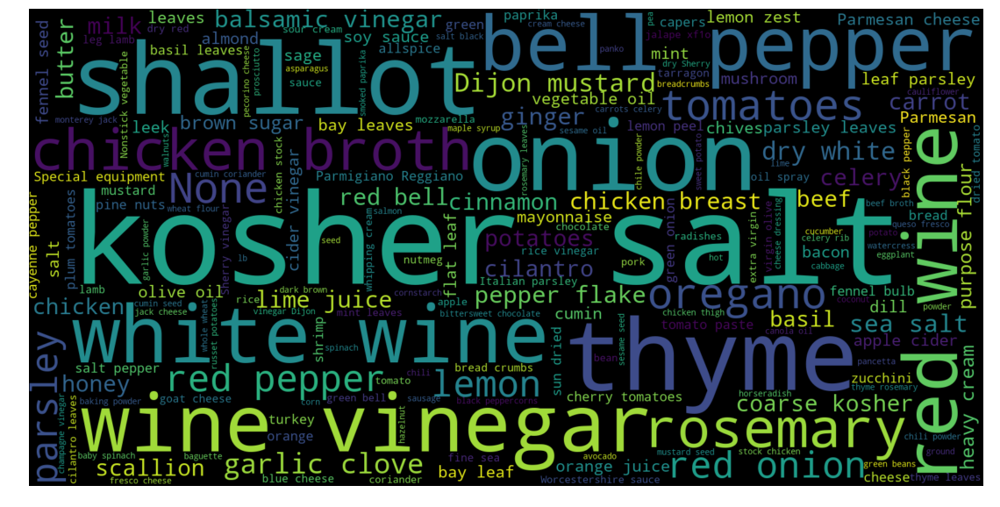

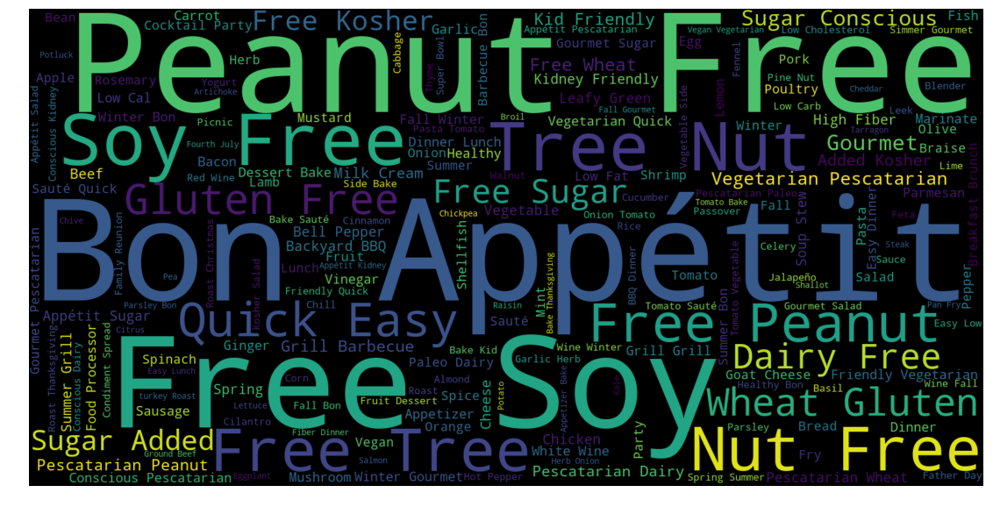

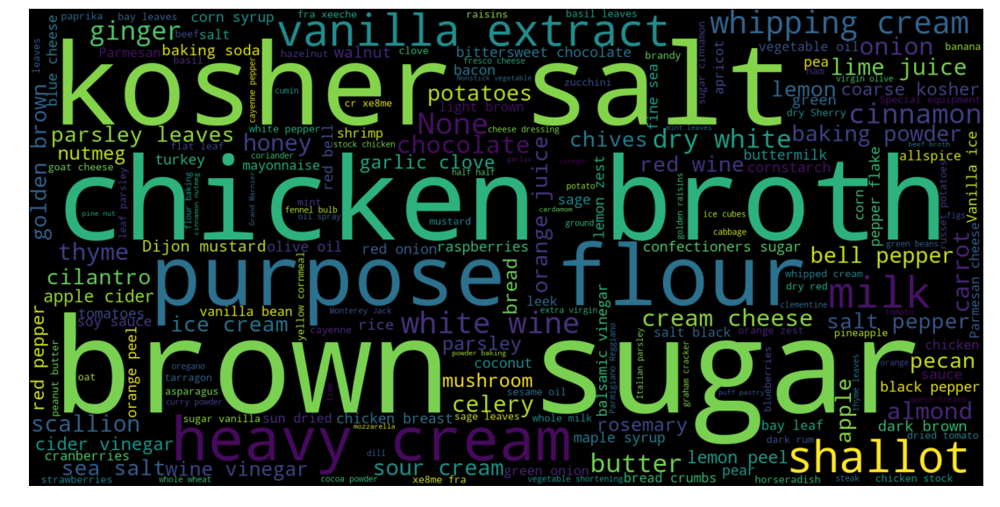

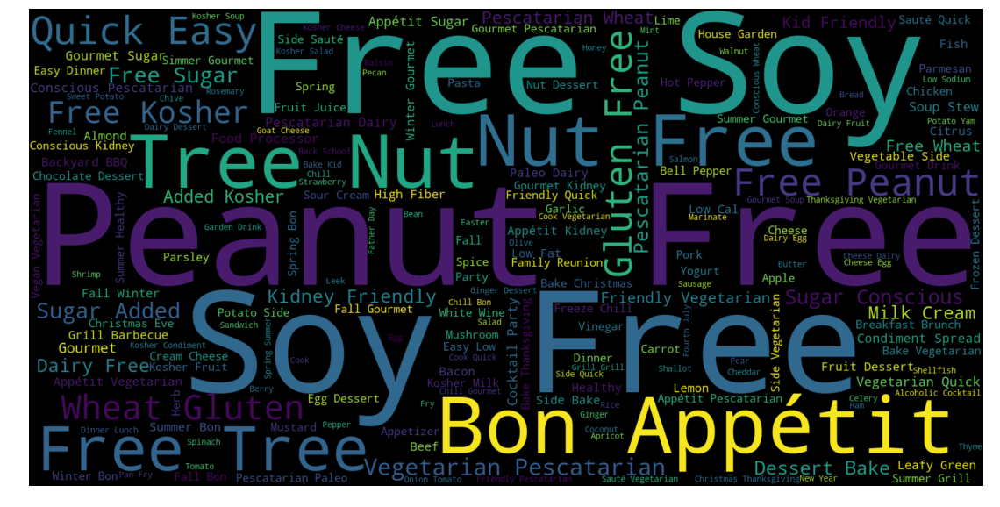

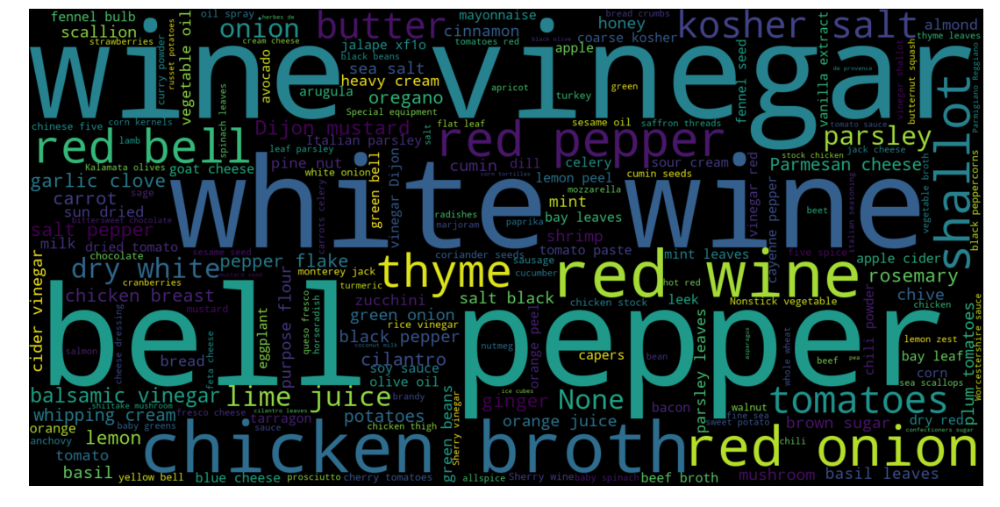

...

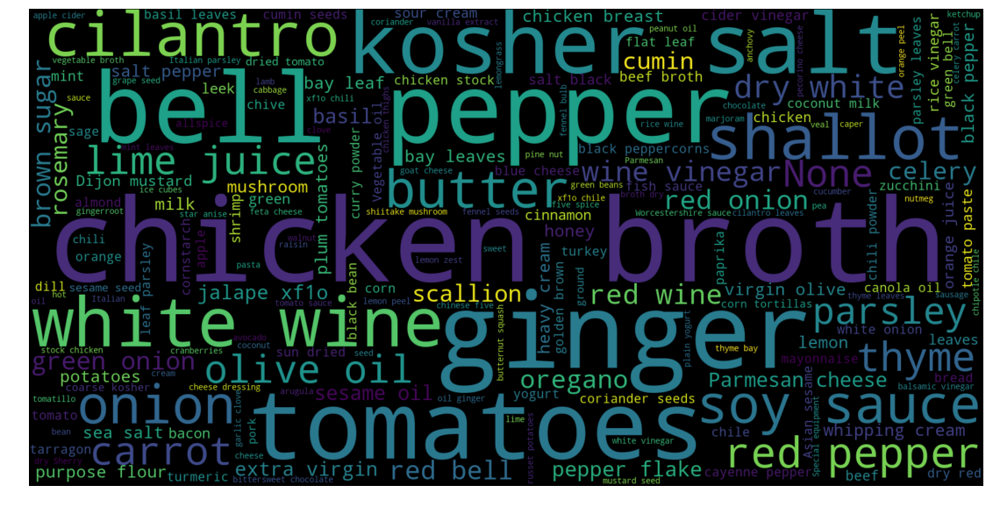

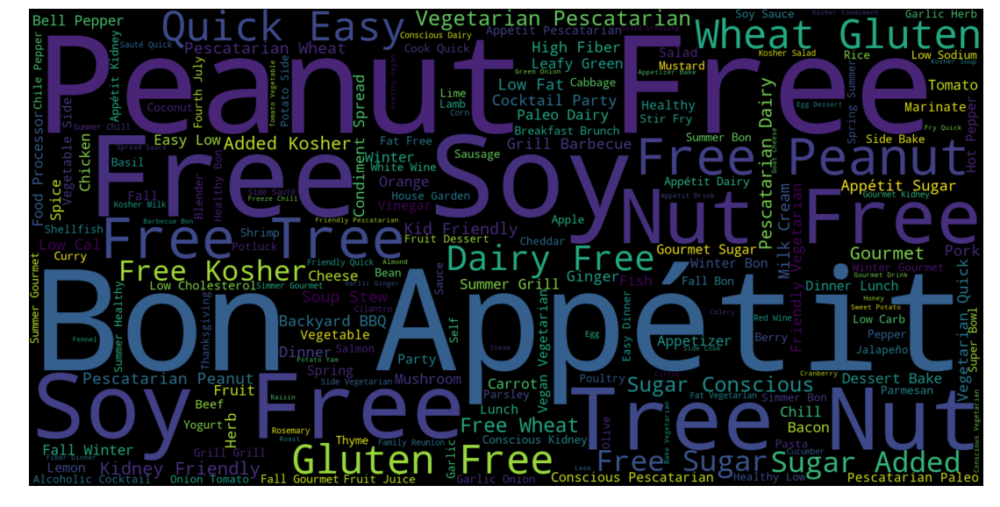

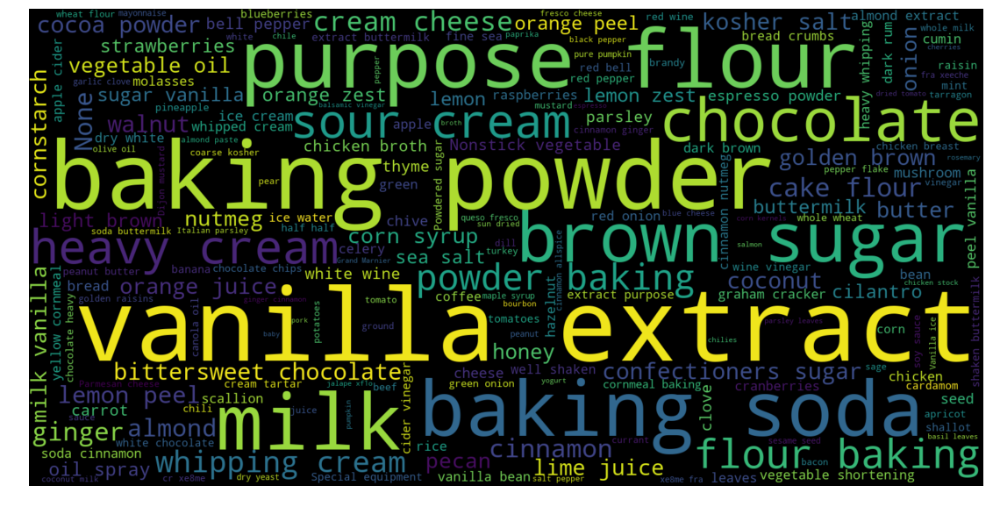

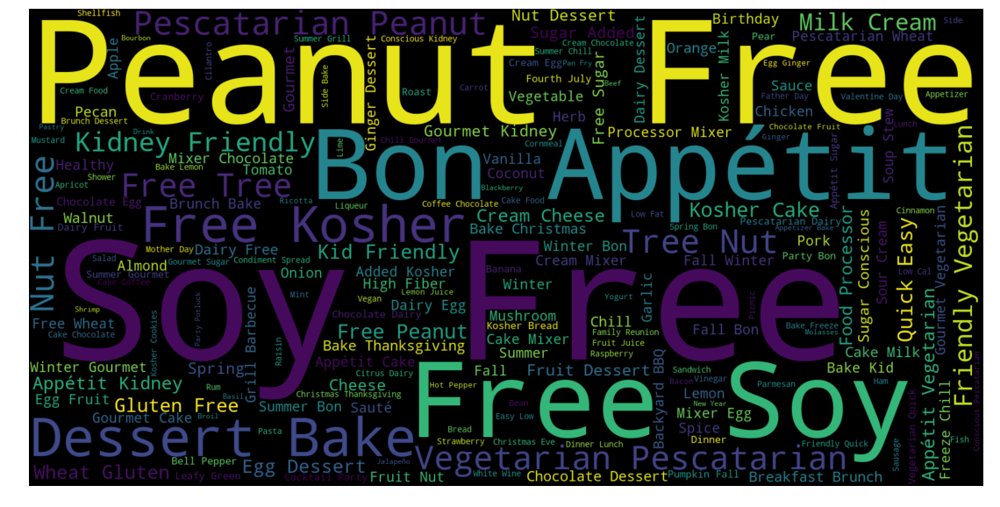

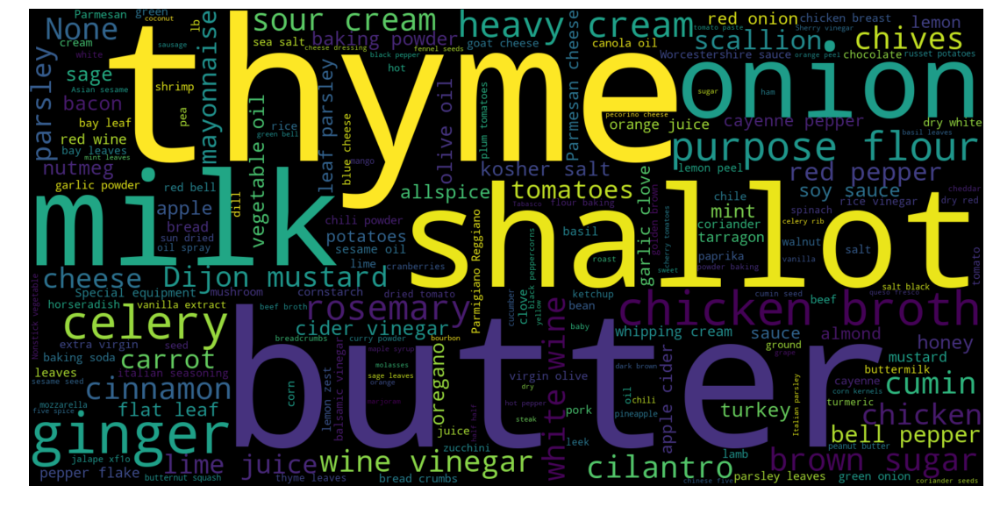

In [19]:
import openpyxl
import numpy as np
from collections import Counter
import pandas as pd
from scipy.cluster.hierarchy import linkage, cophenet, dendrogram, fcluster
from scipy.spatial.distance import pdist
from sklearn.cluster import KMeans, DBSCAN, SpectralClustering
from sklearn import preprocessing
from matplotlib import pyplot as plt
from matplotlib.pyplot import savefig
import sys
import csv
from wordcloud import WordCloud
from sklearn.metrics.pairwise import pairwise_distances


reload(sys)
sys.setdefaultencoding('utf-8')

recipes = np.load('recipes.npy')
recipes_ingredients = []
recipes_titles = []
ingredients_all_list = []
recipes_categories = []
categories = []
recipes_dietery_consideration = []
columns_index = ['E']

start = 0
nr_clusters = 12
nr_ingredients = 13

top_ingredients = ['sugar', 'salt', 'olive oil', 'garlic', 'unsalted butter']


ingredients = np.load('recipes_only_ingredients.npy')
for ing in ingredients:
    ing = ing.replace('[', '').replace(']', '').replace(" u'", '').replace(" '", '').replace("u'", '')\
        .replace('uEquipment: ', '').replace("'", '')
    ing = ing.split(',')
    recipes_ingredients.append(ing)

wb = openpyxl.load_workbook('epicurious_categories.xlsx')
first_sheet = wb.get_sheet_names()[0]
worksheet = wb.get_sheet_by_name(first_sheet)

for i, column in enumerate(columns_index):
    for row in range(2, len(worksheet[column])):
        cell_name = "{}{}".format(column, row)
        if worksheet[cell_name].value is not None:
            categories.append(str(worksheet[cell_name].value))

for ingr1 in recipes_ingredients:
    for ingr2 in ingr1:
        ingredients_all_list.append(ingr2)

for rec in recipes:
    recipes_titles.append(rec.get('title'))
    recipes_categories.append(rec.get('categories'))

for rcc in recipes_categories:
    recipes_dietery_consideration.append([i for i in rcc if i in categories])

ingr_occurence = Counter(ingredients_all_list)


values_recipes = []
ingredients_for_KMeans = []
for io in ingr_occurence.most_common(nr_ingredients):
    ingredients_for_KMeans.append(io[0])
    
int_ingredients = list(range(1, len(ingredients_for_KMeans) + 1))
index = list(range(0, len(recipes_titles)))
column_headers = ['ingredient_' + str(i) for i in ingredients_for_KMeans]

for rp in recipes_ingredients:
    value_recipe = [0 for i in ingredients_for_KMeans]
    for ip in rp:
        for k, ifk in enumerate(ingredients_for_KMeans):
            if ip == ifk:
                value_recipe[k] = 1
                break
    values_recipes.append(value_recipe)

values_ingredients_recipes = pd.DataFrame(data=values_recipes, index=index, columns=column_headers,
                                          dtype=float)

X = np.array(values_ingredients_recipes)

clf = KMeans(n_clusters=nr_clusters)
clf.fit(X)
print clf.labels_
print 'Inertia for ingredients number: ', nr_ingredients, ' and cluster number ', nr_clusters, ' : ', clf.inertia_

for label_nr in range(0, nr_clusters):
    recipes_with_labels = []
    for n, recipe in enumerate(recipes):
        if clf.labels_[n] == label_nr:
            temp = {}
            temp['title'] = recipe.get('title')
            temp['ingredients'] = recipes_ingredients[n]
            temp['label'] = clf.labels_[n]
            temp['categories'] = recipe.get('categories')
            recipes_with_labels.append(temp)
    
    #with open("recipes_with_labels_" + str(label_nr) + ".csv", "wb") as myfile:
    #    wr = csv.writer(myfile, quoting=csv.QUOTE_ALL)
    #    wr.writerow(recipes_with_labels)
    
    to_plot_categories = []
    to_plot_ingredients = []
    for tp in recipes_with_labels:
        for t in tp.get('categories'):
            to_plot_categories.append(t)
        for p in tp.get('ingredients'):
            if p not in ingredients_for_KMeans:
                to_plot_ingredients.append(p)
    
    # Generate a word cloud image
    wordcloud = WordCloud(width=1600, height=800).generate(' '.join(to_plot_ingredients))
    plt.figure(figsize=(20, 10))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    # savefig('ingredients_cloud_' + str(label_nr) + '.png', bbox_inches='tight')
    plt.show()
    
    wordcloud = WordCloud(width=1600, height=800).generate(' '.join(to_plot_categories))
    plt.figure( figsize=(20, 10))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    # savefig('categories_cloud_' + str(label_nr) + '.png', bbox_inches='tight')
    plt.show

In [24]:
from sklearn.metrics.pairwise import pairwise_distances, cosine_similarity

values_ingredients_recipes = pd.read_csv('binary_matrix_ingredients.csv')

X = np.array(values_ingredients_recipes)

similarity_matrix = cosine_similarity(X)

print (similarity_matrix[0])